In [1]:
import numpy as np
import pandas as pd
import datetime
import matplotlib 
from matplotlib import pyplot as plt
import gc
import multiprocessing as mp
from multiprocessing import Process, Queue
queue = Queue()
import random
from matplotlib.pyplot import figure
import math

In [2]:
def read_df(file_title,house_nb):
    try:
        df=pd.read_table(file_title, sep="," )
        df.columns = ["time","consumption"]
        try:
            df['time'] = pd.to_datetime(df['time'],unit='s')
        except:
            df['time'] = pd.to_datetime(df['time'])
        df.index= df.time
        df = df.sort_index()
        df.reset_index(drop=True, inplace=True)
        return (df,house_nb)
    except:
        return(None)

In [3]:
pool = mp.Pool(processes = 3)
result=pool.starmap(read_df,(("Refit_Resampled/fridge_freezer/house_"+str(i+1)+".csv",i+1) for i in range(21)))
Refit_fridge_freezers={}
for i in range(len(result)):
    if result[i]!=None:
        Refit_fridge_freezers[result[i][1]]=result[i][0]

In [4]:
def csv_to_activations(file_title):
    df=pd.read_table(file_title, sep="," )
    df = df[['beginning', 'end']]
    activation = [tuple(x) for x in df.to_numpy()]
    return(activation)

In [5]:
Refit_fridge_freezer_activations={}
for house_nb in Refit_fridge_freezers.keys():
    Refit_fridge_freezer_activations[house_nb]=csv_to_activations("Refit_activations/fridge_freezer/house_"+str(house_nb))
Refit_fridge_freezer_activations.keys()

dict_keys([2, 3, 4, 5, 9, 10, 11, 12, 15, 16, 17, 18, 19, 21])

In [6]:
def add_margin(activation_list,df_length,margin=1):
  on_consumptions=[]
  for activation_tuple in activation_list:
    if ((activation_tuple[0]-margin)>=1):
      start=activation_tuple[0]-margin
    else:
      start=1
    if ((activation_tuple[1]+margin)<=df_length):
      end=activation_tuple[1]+margin
    else:
      end=df_length
    on_consumptions.append((start,end))
  return(on_consumptions)

In [7]:
Refit_fridge_freezer_activations_margin={}
for key in Refit_fridge_freezer_activations.keys():
    Refit_fridge_freezer_activations_margin[key]=add_margin(Refit_fridge_freezer_activations[key],len(Refit_fridge_freezers[key].index),2)

In [8]:
print(Refit_fridge_freezer_activations_margin[2][1])
print(Refit_fridge_freezer_activations[2][1])

(410, 557)
(412, 555)


In [9]:
Refit_fridge_freezer_activations=Refit_fridge_freezer_activations_margin

In [10]:
for key in Refit_fridge_freezer_activations.keys():
    activations=Refit_fridge_freezer_activations[key]
    Refit_fridge_freezer_activations[key]=[]
    for activation in activations:
        if (round((activation[1]-activation[0])/6)<=4000):
            Refit_fridge_freezer_activations[key].append(activation)

In [11]:
def get_activation_avg (df,activations,house_nb):
    averages=[]
    for activation in activations:
        start=activation[0]
        end=activation[1]
        avg=sum(df.consumption.iloc[start:end])/len(df.consumption.iloc[start:end])
        averages.append(avg)
    return(averages,house_nb)

In [12]:
pool = mp.Pool(processes = 3)
result=pool.starmap(get_activation_avg,((Refit_fridge_freezers[i],Refit_fridge_freezer_activations[i],i) for i in Refit_fridge_freezers.keys() ))

In [13]:
Refit_fridge_freezer_avg={}
for i in range(len(result)):
        Refit_fridge_freezer_avg[result[i][1]]=result[i][0]

In [14]:
Refit_fridge_freezer_avg.keys()

dict_keys([2, 3, 4, 5, 9, 10, 11, 12, 15, 16, 17, 18, 19, 21])

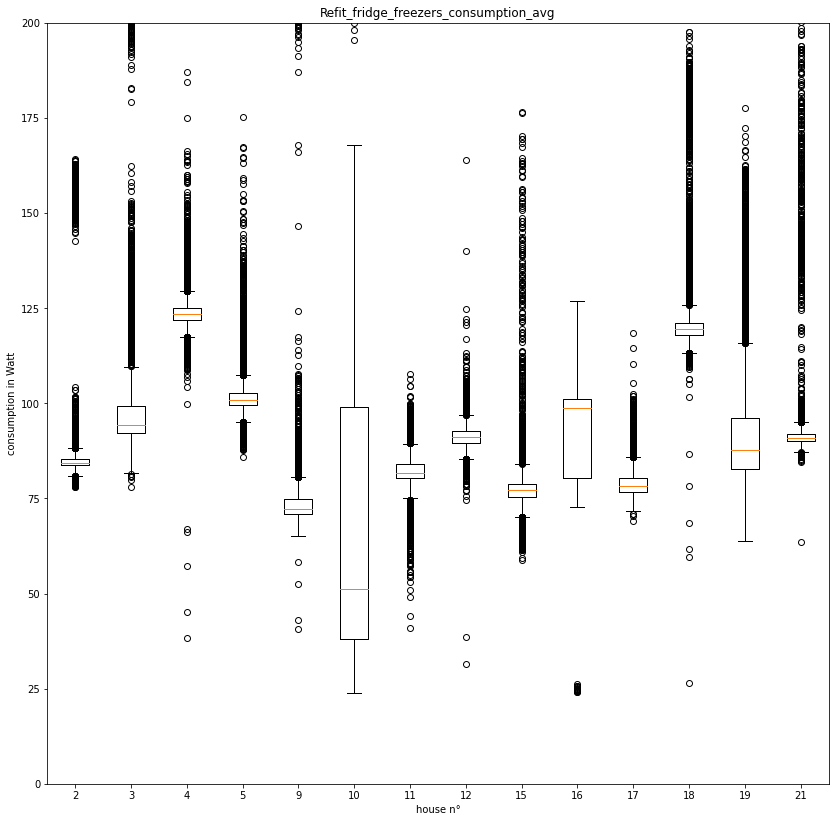

In [15]:
fig7, ax7 = plt.subplots(figsize=(14,14))
ax7.set_title('Refit_fridge_freezers_consumption_avg')
ax7.boxplot(Refit_fridge_freezer_avg.values())
ax7.set_ylim(0,200)
ax7.set_xticklabels(Refit_fridge_freezers.keys())
#plt.savefig('Refit_fridge_freezers_consumption_avg.jpg',dpi=184)
plt.ylabel("consumption in Watt")
plt.xlabel("house n°")
plt.show()

In [14]:
min_avg_thresh={2:81,3:82,4:116,5:95,9:60,11:75,12:85,15:70,16:40,17:71,18:113,19:20,21:86}

In [15]:
for key in min_avg_thresh.keys():
    activations=Refit_fridge_freezer_activations[key]
    averages=Refit_fridge_freezer_avg[key]
    Refit_fridge_freezer_activations[key]=[]
    for i in range(len(activations)):
        if averages[i]>=min_avg_thresh[key]:
            Refit_fridge_freezer_activations[key].append(activations[i])

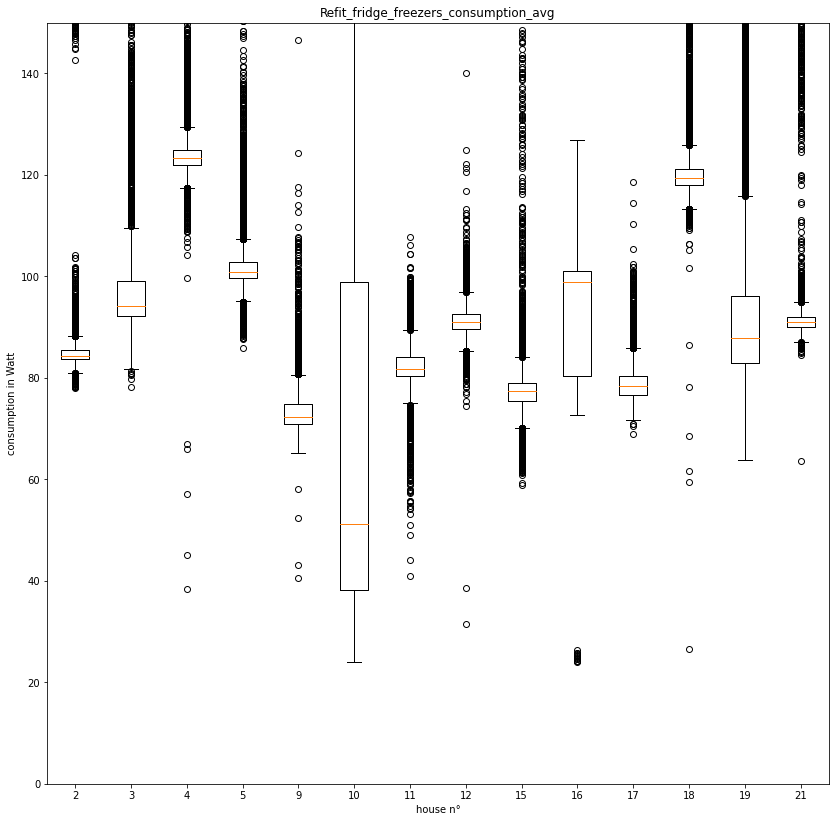

In [18]:
fig7, ax7 = plt.subplots(figsize=(14,14))
ax7.set_title('Refit_fridge_freezers_consumption_avg')
ax7.boxplot(Refit_fridge_freezer_avg.values())
ax7.set_ylim(0,150)
ax7.set_xticklabels(Refit_fridge_freezers.keys())
plt.savefig('Refit_fridge_freezers_consumption_avg_cleaned.jpg',dpi=184)
plt.ylabel("consumption in Watt")
plt.xlabel("house n°")
plt.show()

In [19]:
nb_of_activations=[]
for key in Refit_fridge_freezer_activations.keys():
    nb_of_activations.append(len(Refit_fridge_freezer_activations[key]))

<ipython-input-20-ae2d95e21f68>:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels([2, 3, 4, 5, 9, 10, 11, 12, 15, 16, 17, 18, 19, 21],fontsize=18)


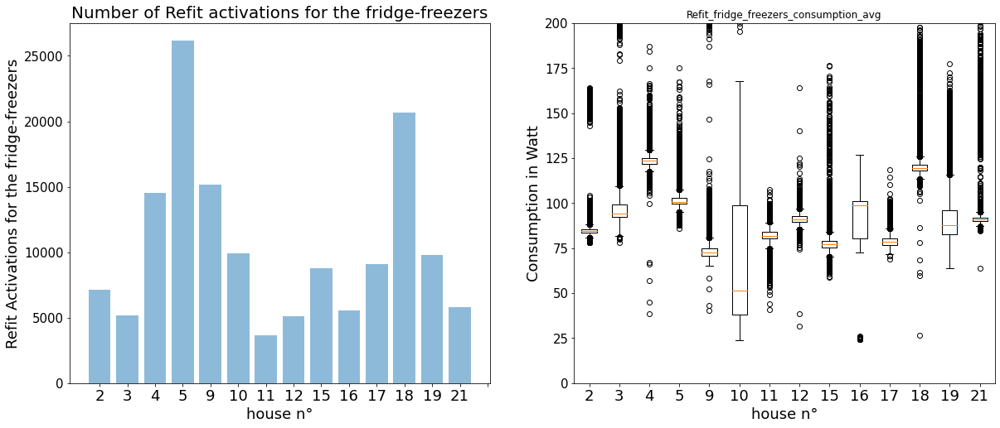

In [20]:
fig, (ax1, ax7) = plt.subplots(1,2,figsize=(20,8))

y_pos = np.arange(14)
ax1.bar(y_pos,nb_of_activations, align='center', alpha=0.5)
ax1.set_title('Number of Refit activations for the fridge-freezers',fontsize=20)
ax1.set_xlabel('house n°', fontsize=18)
ax1.set_ylabel('Refit Activations for the fridge-freezers', fontsize=18)
plt.setp(ax1.get_yticklabels(), fontsize=15)
ax1.set_xticklabels([2, 3, 4, 5, 9, 10, 11, 12, 15, 16, 17, 18, 19, 21],fontsize=18)
ax1.xaxis.set_major_locator(matplotlib.ticker.FixedLocator([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14]))

ax7.set_title('Refit_fridge_freezers_consumption_avg')
ax7.boxplot(Refit_fridge_freezer_avg.values())
ax7.set_ylim(0,200)
ax7.set_xticklabels(Refit_fridge_freezers.keys(),fontsize=18)
ax7.set_xlabel('house n°', fontsize=18)
ax7.set_ylabel('Consumption in Watt', fontsize=18)
plt.setp(ax7.get_yticklabels(), fontsize=15)


#plt.savefig('Number-Activations_Consumption-Avg_fridge_freezers.jpg',dpi=184)
plt.show()

In [21]:
def get_activation_max (df,activations,house_nb):
    maximums=[]
    for activation in activations:
        start=activation[0]
        end=activation[1]
        maximus=max(df.consumption.iloc[start:end])
        maximums.append(maximus)
    return(maximums,house_nb)

In [22]:
pool = mp.Pool(processes = 3)
result=pool.starmap(get_activation_max,((Refit_fridge_freezers[i],Refit_fridge_freezer_activations[i],i) for i in Refit_fridge_freezers.keys() ))

In [23]:
Refit_fridge_freezer_max={}
for i in range(len(result)):
        Refit_fridge_freezer_max[result[i][1]]=result[i][0]

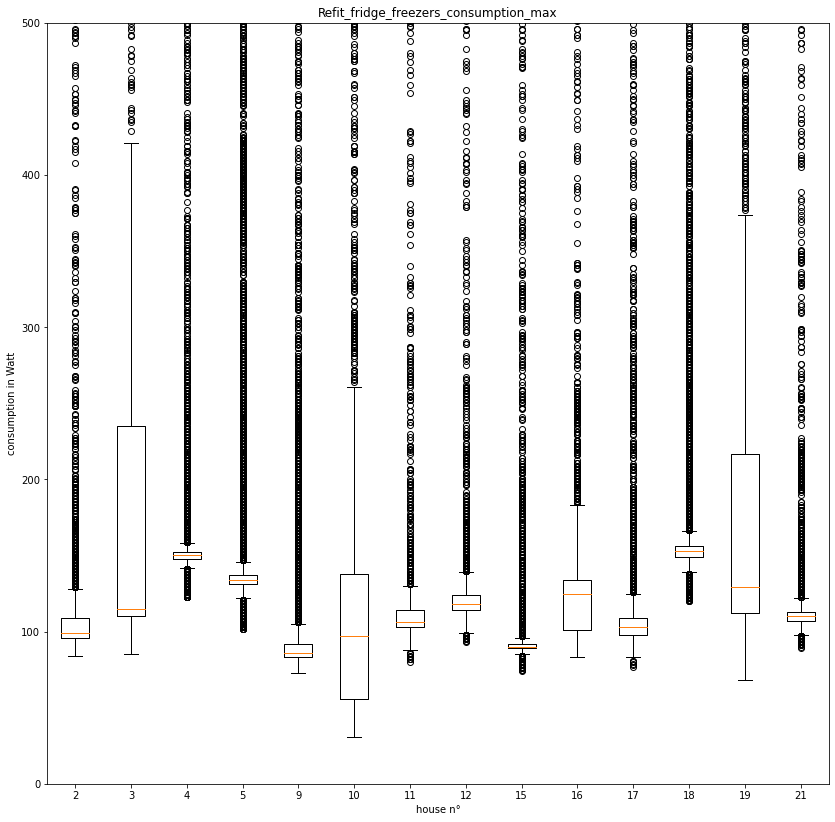

In [24]:
fig7, ax7 = plt.subplots(figsize=(14,14))
ax7.set_title('Refit_fridge_freezers_consumption_max')
ax7.boxplot(Refit_fridge_freezer_max.values())
ax7.set_ylim(0,500)
ax7.set_xticklabels(Refit_fridge_freezers.keys())
plt.savefig('Refit_fridge_freezers_consumption_max.jpg',dpi=184)
plt.ylabel("consumption in Watt")
plt.xlabel("house n°")
plt.show()

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

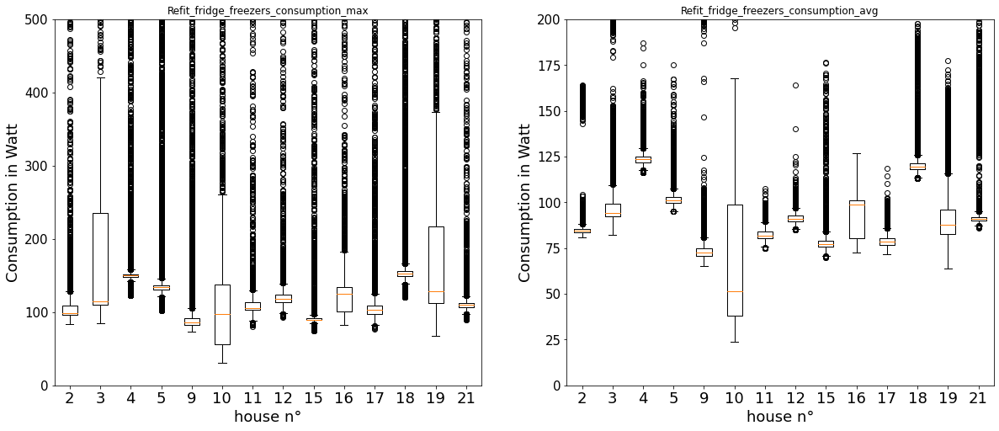

In [26]:
fig, (ax1, ax7) = plt.subplots(1,2,figsize=(20,8))

ax1.set_title('Refit_fridge_freezers_consumption_max')
ax1.boxplot(Refit_fridge_freezer_max.values())
ax1.set_ylim(0,500)
ax1.set_xticklabels(Refit_fridge_freezers.keys(),fontsize=18)
ax1.set_xlabel('house n°', fontsize=18)
ax1.set_ylabel('Consumption in Watt', fontsize=18)
plt.setp(ax1.get_yticklabels(), fontsize=15)

ax7.set_title('Refit_fridge_freezers_consumption_avg')
ax7.boxplot(Refit_fridge_freezer_avg.values())
ax7.set_ylim(0,200)
ax7.set_xticklabels(Refit_fridge_freezers.keys(),fontsize=18)
ax7.set_xlabel('house n°', fontsize=18)
ax7.set_ylabel('Consumption in Watt', fontsize=18)
plt.setp(ax7.get_yticklabels(), fontsize=15)

In [16]:
fridge_freezer_avg_thres={2:92,3:110,4:132,5:112,9:80,11:90,12:108,15:87,16:120,17:85,18:135,19:95,21:105}

In [17]:
fridge_freezer_max_thres={}
for key in fridge_freezer_avg_thres.keys():
    fridge_freezer_max_thres[key]=350

In [18]:
fridge_freezer_max_thres[2]=300
fridge_freezer_max_thres[3]=200
fridge_freezer_max_thres[12]=280
fridge_freezer_max_thres[18]=360
fridge_freezer_max_thres[19]=180

In [19]:
def normal_avg (df,activation,thresh):
    start=activation[0]
    end=activation[1]
    avg=sum(df.consumption.iloc[start:end])/len(df.consumption.iloc[start:end])
    if avg<=thresh:
        return True
    else:
        return False

In [20]:
def normal_max(df,activation,thresh=350):
    start=activation[0]
    end=activation[1]
    maximus=max(df.consumption.iloc[start:end])
    if maximus<=thresh:
        return True
    else:
        return False

In [21]:
def get_normal_activations(df,activations,house_nb):
    normal_activations=[]
    for activation in activations:
        if normal_avg(df,activation,fridge_freezer_avg_thres[house_nb]) and normal_max(df,activation,fridge_freezer_max_thres[house_nb]):
            normal_activations.append(activation)
    return(normal_activations,house_nb)
            

In [22]:
pool = mp.Pool(processes = 3)
result=pool.starmap(get_normal_activations,((Refit_fridge_freezers[i],Refit_fridge_freezer_activations[i],i) for i in fridge_freezer_avg_thres.keys() ))

In [23]:
Refit_fridge_freezer_normal_activations={}
for i in range(len(result)):
        Refit_fridge_freezer_normal_activations[result[i][1]]=result[i][0]

In [142]:
i=21
Refit_fridge_freezer_normal_activations[i]=get_normal_activations(Refit_fridge_freezers[i],Refit_fridge_freezer_activations[i],i)[0]

In [17]:
def get_anomolous_activations(activations,normal_activations,house_nb):
    anomolous_activations=[]
    for activation in activations:
        if activation not in normal_activations:
            anomolous_activations.append(activation)
    return(anomolous_activations,house_nb)

In [25]:
pool = mp.Pool(processes = 3)
result=pool.starmap(get_anomolous_activations,((Refit_fridge_freezer_activations[i],Refit_fridge_freezer_normal_activations[i],i) for i in fridge_freezer_avg_thres.keys() ))

In [26]:
Refit_fridge_freezer_anomolous_activations={}
for i in range(len(result)):
        Refit_fridge_freezer_anomolous_activations[result[i][1]]=result[i][0]

In [67]:
def get_activation_type(activations,normal_activations,house_nb):
    activation_type=[]
    for activation in activations:
        if activation in normal_activations:
            activation_type.append(0)
        else:
            activation_type.append(1)
    return(activation_type,house_nb)

In [42]:
pool = mp.Pool(processes = 3)
result=pool.starmap(get_activation_type,((Refit_fridge_freezer_activations[i],Refit_fridge_freezer_normal_activations[i],i) for i in fridge_freezer_avg_thres.keys() ))

In [43]:
Refit_fridge_freezer_activation_type={}
for i in range(len(result)):
        Refit_fridge_freezer_activation_type[result[i][1]]=result[i][0]

In [143]:
i=21
Refit_fridge_freezer_anomolous_activations[i]=get_anomolous_activations(Refit_fridge_freezer_activations[i],Refit_fridge_freezer_normal_activations[i],i)[0]

[6284, 3798, 13849, 24141, 13451, 3202, 4689, 8063, 4935, 8199, 18900, 5555, 5130]
[880, 1368, 715, 2051, 1721, 439, 415, 702, 628, 901, 1761, 4264, 684]


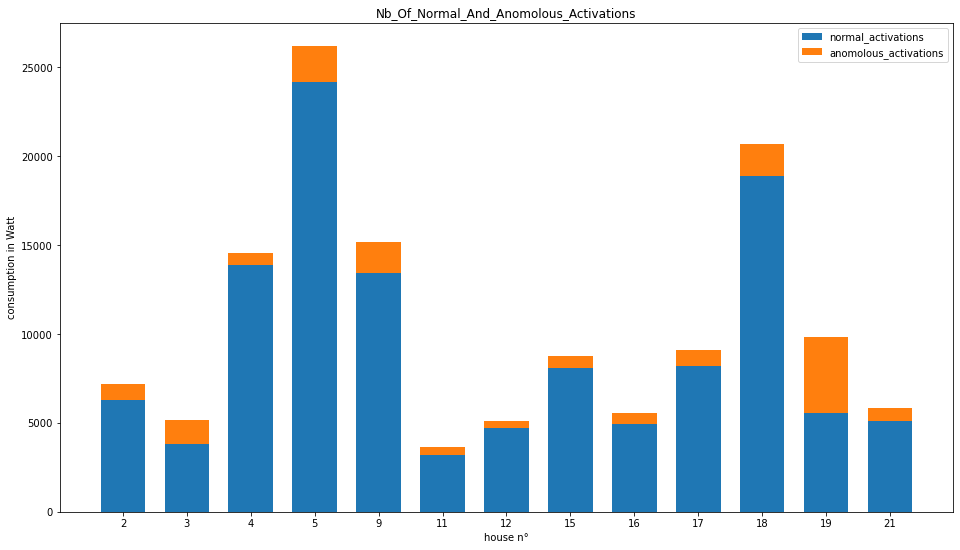

In [11]:
nb_normal_activations=[]
nb_anomolous_activations=[]
for i in Refit_fridge_freezer_normal_activations.keys(): 
    nb_normal_activations.append(len(Refit_fridge_freezer_normal_activations[i]))
    nb_anomolous_activations.append(len(Refit_fridge_freezer_anomolous_activations[i]))
fig, ax = plt.subplots(figsize =(16, 9))
width =0.7
y_pos = np.arange(13)
ax.bar(np.arange(len(nb_normal_activations)), nb_normal_activations, width=width,label='normal_activations')
ax.bar(np.arange(len(nb_anomolous_activations)), nb_anomolous_activations,bottom=nb_normal_activations, width=width,label="anomolous_activations")
plt.xticks(y_pos, Refit_fridge_freezer_normal_activations.keys())
plt.title('Nb_Of_Normal_And_Anomolous_Activations')
plt.legend()
plt.ylabel("consumption in Watt")
plt.xlabel("house n°")

plt.savefig('Nb_Of_Normal_And_Anomolous_Activations.jpg',dpi=184)


#plt.show()
print(nb_normal_activations)
print(nb_anomolous_activations)

/home/mahdi/anaconda3/envs/tf-gpu/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:337: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


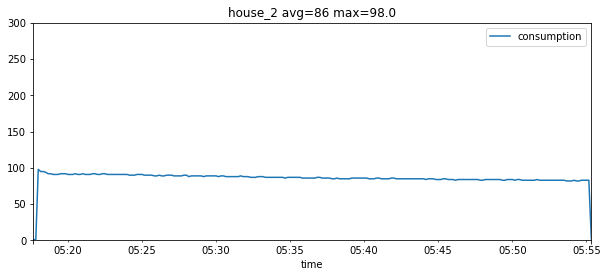

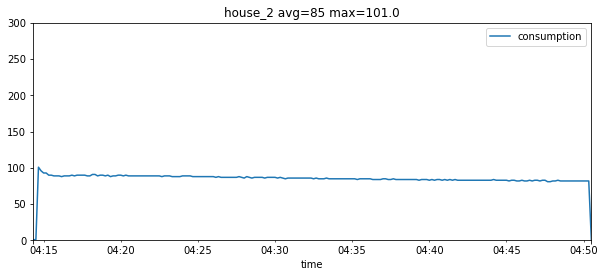

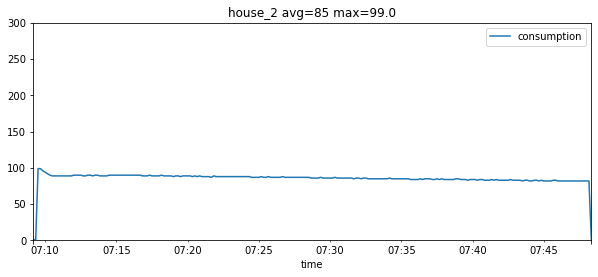

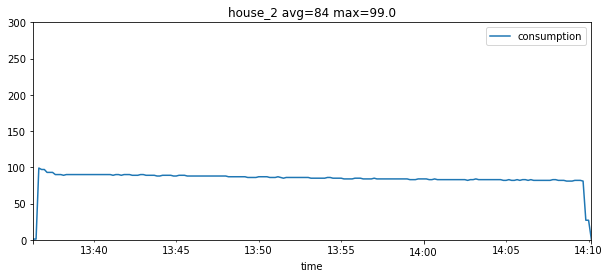

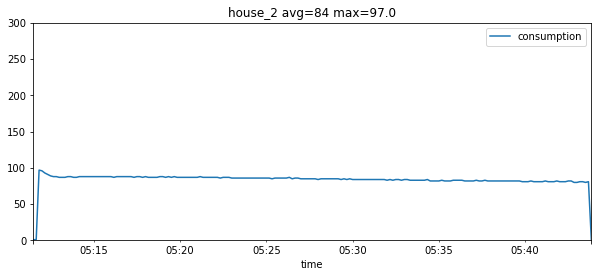

...

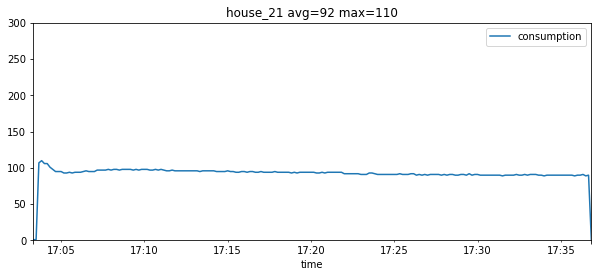

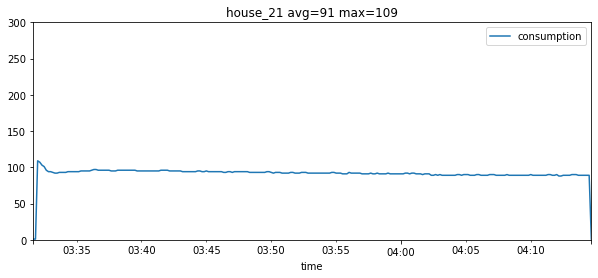

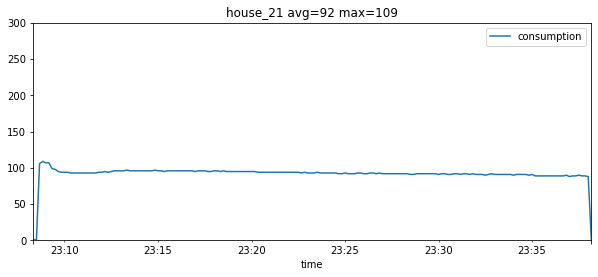

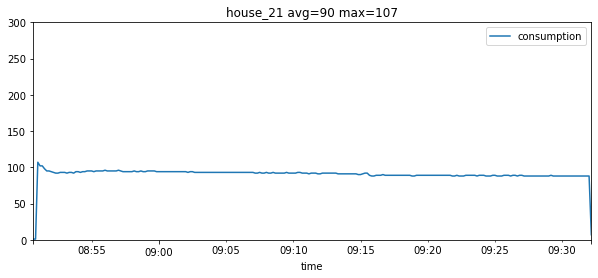

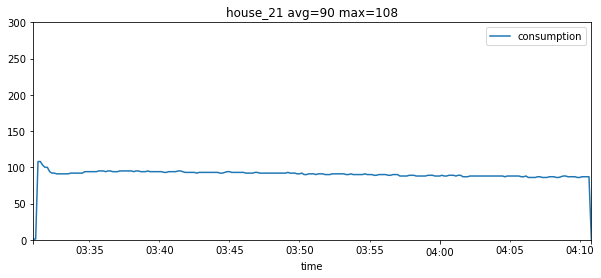

In [46]:
for house in fridge_freezer_avg_thres.keys():
    activations=random.sample(range(0, len(Refit_fridge_freezer_normal_activations[house])),10)
    df=Refit_fridge_freezers[house]
    for activation in activations:
        beginning=Refit_fridge_freezer_normal_activations[house][activation][0]
        end=Refit_fridge_freezer_normal_activations[house][activation][1]
        avg=sum(df.consumption.iloc[beginning:end])/len(df.consumption.iloc[beginning:end])
        maximus=max(df.consumption.iloc[beginning:end])
        ax=df.iloc[beginning:end].plot(x="time",y=['consumption'], figsize=(10,4),title="house_"+str(house)+" avg="+str(round(avg))+" max="+str(maximus))
        ax.set_ylim(0,300)

/home/mahdi/anaconda3/envs/tf-gpu/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:337: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


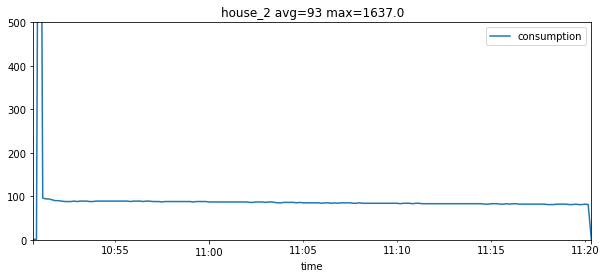

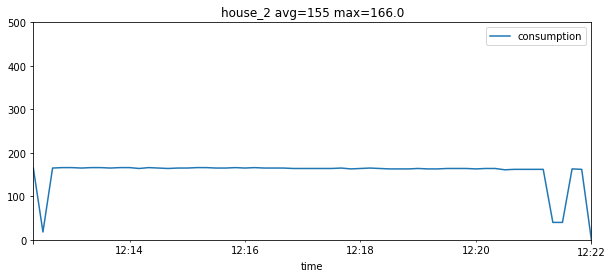

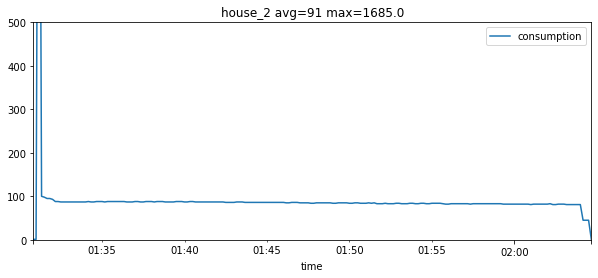

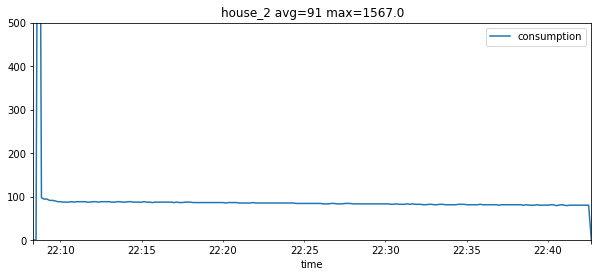

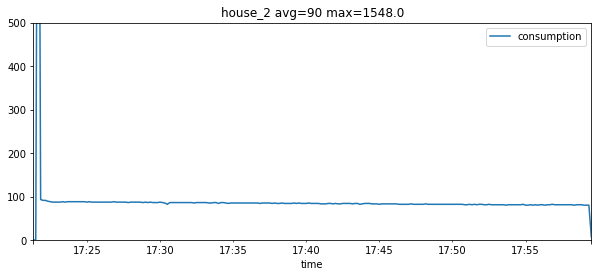

...

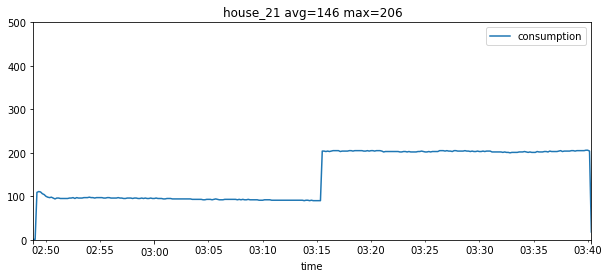

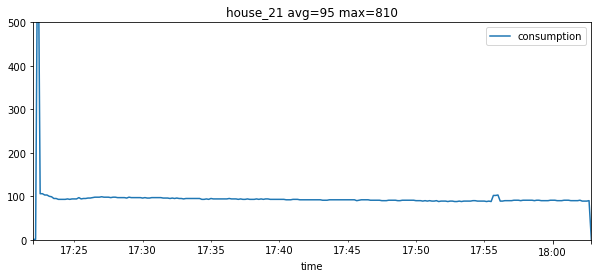

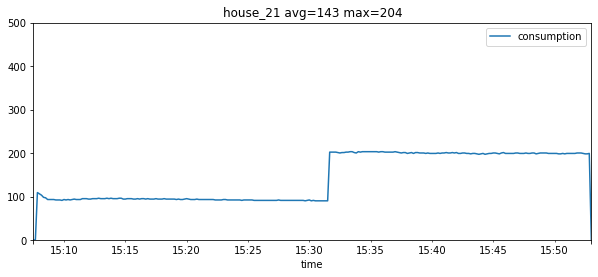

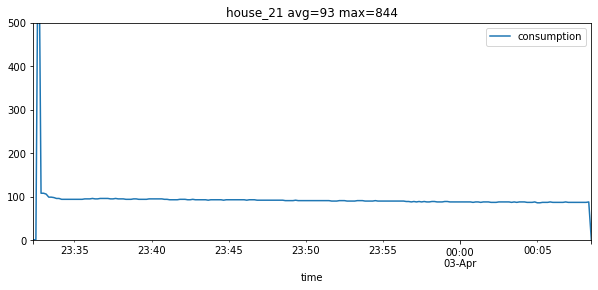

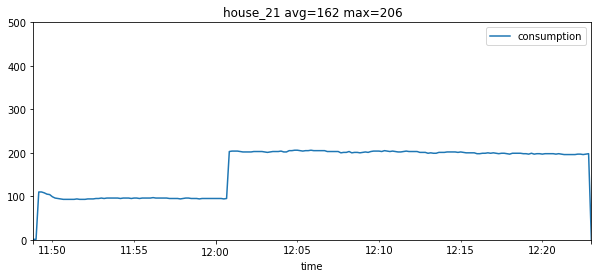

In [47]:
for house in fridge_freezer_avg_thres.keys():
    activations=random.sample(range(0, len(Refit_fridge_freezer_anomolous_activations[house])),10)
    df=Refit_fridge_freezers[house]
    for activation in activations:
        beginning=Refit_fridge_freezer_anomolous_activations[house][activation][0]
        end=Refit_fridge_freezer_anomolous_activations[house][activation][1]
        avg=sum(df.consumption.iloc[beginning:end])/len(df.consumption.iloc[beginning:end])
        maximus=max(df.consumption.iloc[beginning:end])
        ax=df.iloc[beginning:end].plot(x="time",y=['consumption'], figsize=(10,4),title="house_"+str(house)+" avg="+str(round(avg))+" max="+str(maximus))        
        ax.set_ylim(0,500)

/home/mahdi/anaconda3/envs/tf-gpu/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:337: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


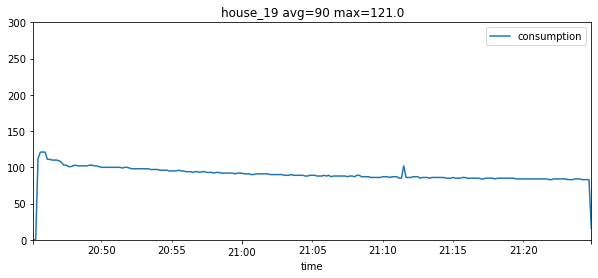

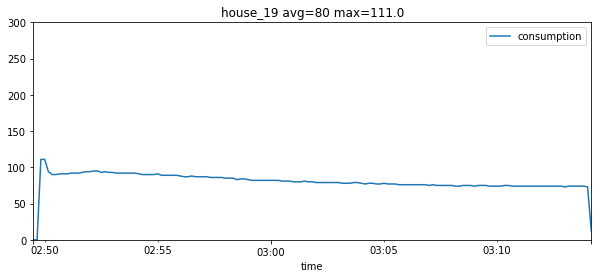

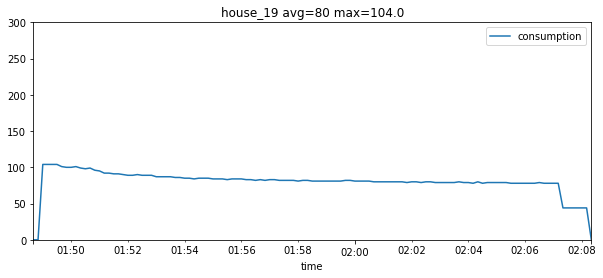

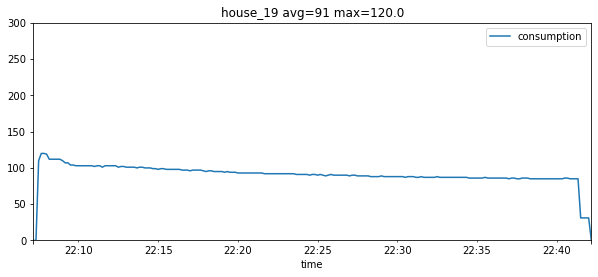

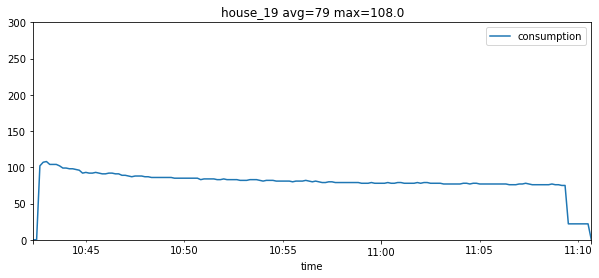

...

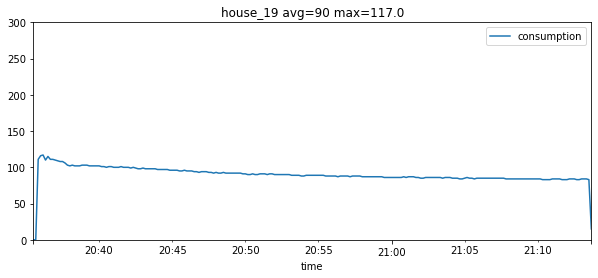

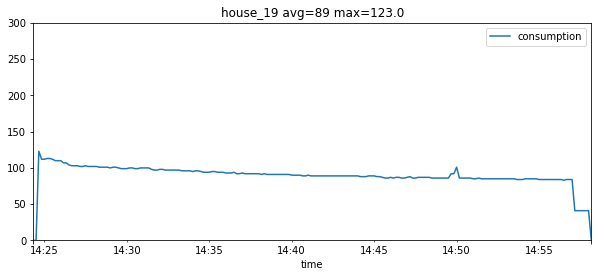

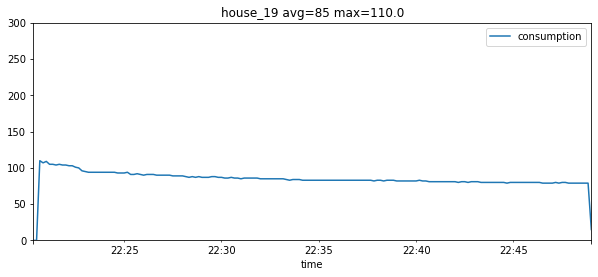

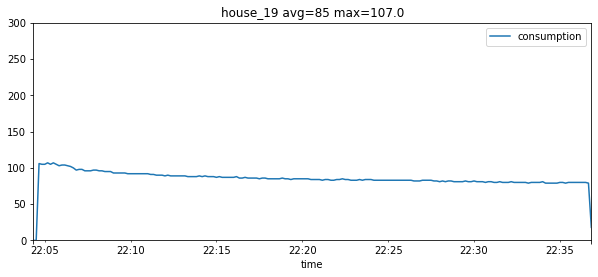

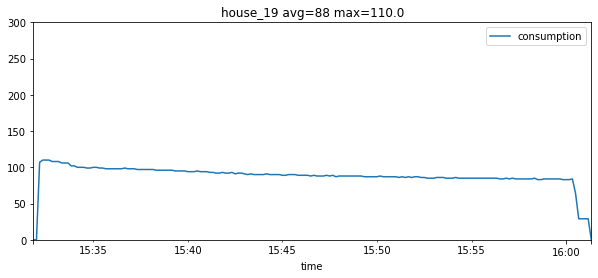

In [33]:
house=19
activations=random.sample(range(0, len(Refit_fridge_freezer_normal_activations[house])),100)
df=Refit_fridge_freezers[house]
for activation in activations:
    beginning=Refit_fridge_freezer_normal_activations[house][activation][0]
    end=Refit_fridge_freezer_normal_activations[house][activation][1]
    avg=sum(df.consumption.iloc[beginning:end])/len(df.consumption.iloc[beginning:end])
    maximus=max(df.consumption.iloc[beginning:end])
    ax=df.iloc[beginning:end].plot(x="time",y=['consumption'], figsize=(10,4),title="house_"+str(house)+" avg="+str(round(avg))+" max="+str(maximus))
    ax.set_ylim(0,300)

/home/mahdi/anaconda3/envs/tf-gpu/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:337: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


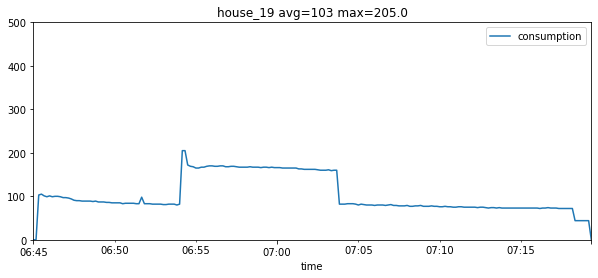

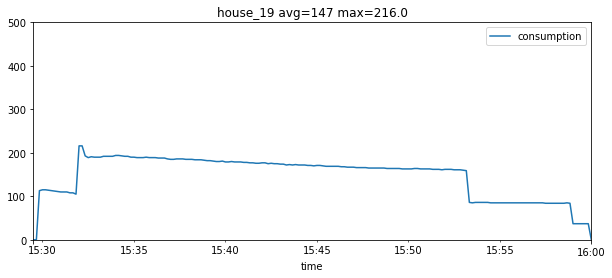

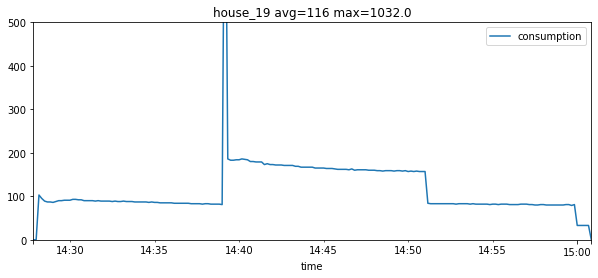

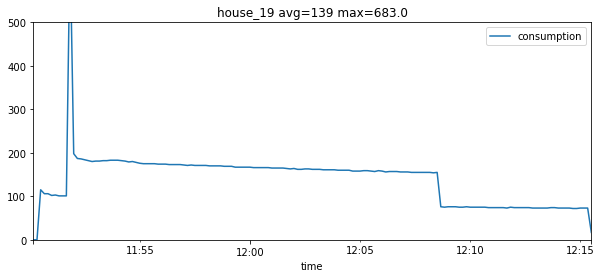

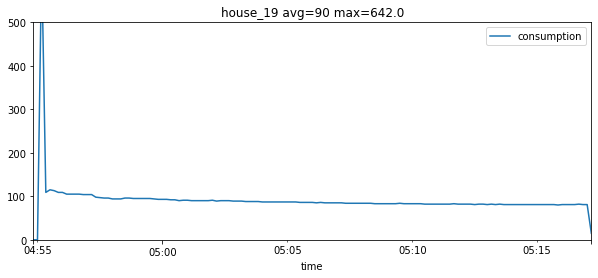

...

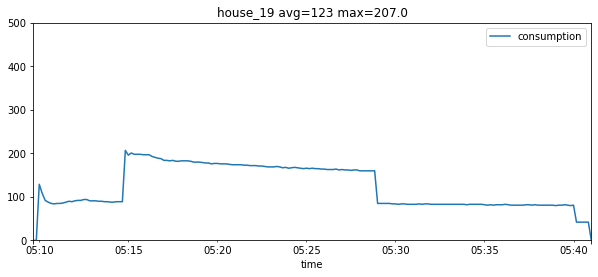

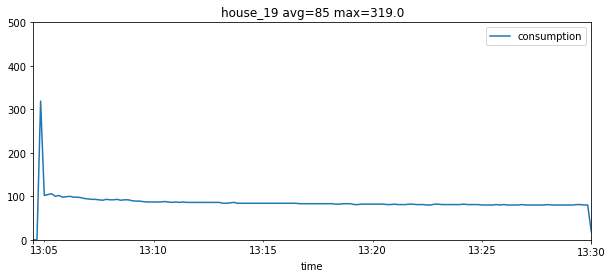

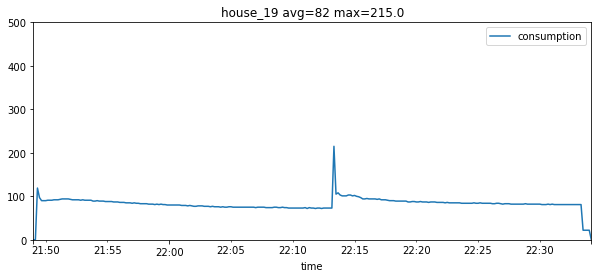

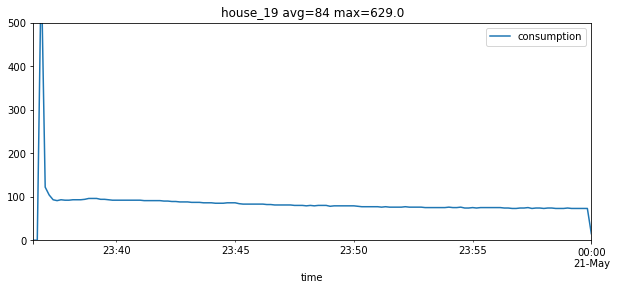

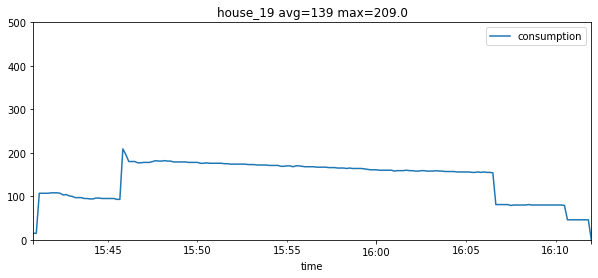

In [34]:
house=19
activations=random.sample(range(0, len(Refit_fridge_freezer_anomolous_activations[house])),100)
df=Refit_fridge_freezers[house]
for activation in activations:
    beginning=Refit_fridge_freezer_anomolous_activations[house][activation][0]
    end=Refit_fridge_freezer_anomolous_activations[house][activation][1]
    avg=sum(df.consumption.iloc[beginning:end])/len(df.consumption.iloc[beginning:end])
    maximus=max(df.consumption.iloc[beginning:end])
    ax=df.iloc[beginning:end].plot(x="time",y=['consumption'], figsize=(10,4),title="house_"+str(house)+" avg="+str(round(avg))+" max="+str(maximus))
    ax.set_ylim(0,500)

In [65]:
def activations_to_csv(activations,activation_type,house_nb):
    df=pd.DataFrame(activations, columns =['beginning','end'])
    df1 = pd.DataFrame(activation_type, columns =['label'])
    df_row = pd.concat([df, df1],axis=1)
    df_row.to_csv("Refit_activations/labels/fridge_freezer_duration/house_"+str(house_nb),index=False)

In [91]:
for i in Refit_fridge_freezer_activation_type.keys():
    activations_to_csv(Refit_fridge_freezer_activations[i],Refit_fridge_freezer_activation_type[i],i)

In [6]:
def csv_to_activations(file_title):
    df=pd.read_table(file_title, sep="," )
    df = df[['beginning', 'end','label']]
    activation = [tuple(x[0:2]) for x in df.to_numpy()]
    activation_type = [x[2] for x in df.to_numpy()]
    return(activation,activation_type)

In [7]:
Refit_fridge_freezer_activation_type={}
Refit_fridge_freezer_activations={}
for house_nb in range(22):
    try:
        Refit_fridge_freezer_activations[house_nb]=csv_to_activations("Refit_activations/labels/fridge_freezer/house_"+str(house_nb))[0]
        Refit_fridge_freezer_activation_type[house_nb]=csv_to_activations("Refit_activations/labels/fridge_freezer/house_"+str(house_nb))[1]
    except:
        None

In [8]:
def normal_anomolous(activations,activation_type,house_nb):
    normal_activations=[]
    anomolous_activations=[]
    for i in range(len(activations)):
        if activation_type[i]==0:
            normal_activations.append(activations[i])
        else:
            anomolous_activations.append(activations[i])
    return(normal_activations,anomolous_activations,house_nb)

In [9]:
Refit_fridge_freezer_normal_activations={}
Refit_fridge_freezer_anomolous_activations={}
for house_nb in Refit_fridge_freezer_activations.keys():
    result=normal_anomolous(Refit_fridge_freezer_activations[house_nb],Refit_fridge_freezer_activation_type[house_nb],house_nb)
    Refit_fridge_freezer_normal_activations[house_nb]=result[0]
    Refit_fridge_freezer_anomolous_activations[house_nb]=result[1]

In [10]:
def get_durations(activations):
    durations=[]
    for activation in activations:
        durations.append(round((activation[1]-activation[0])/6))
    return (durations)

In [11]:
Refit_fridge_freezers_durations=[]
for house in Refit_fridge_freezer_normal_activations.keys():
    Refit_fridge_freezers_durations.append(get_durations(Refit_fridge_freezer_normal_activations[house]))

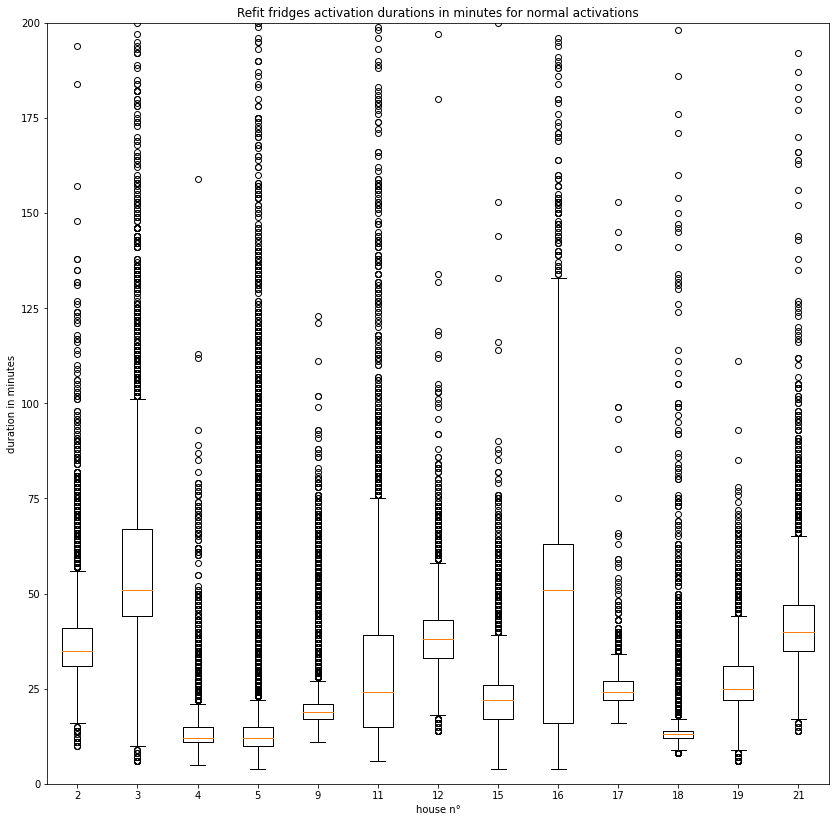

In [12]:
fig7, ax7 = plt.subplots(figsize=(14,14))
ax7.set_title('Refit fridges activation durations in minutes for normal activations')
ax7.boxplot(Refit_fridge_freezers_durations)
ax7.set_ylim(0,200)
ax7.set_xticklabels(Refit_fridge_freezer_normal_activations.keys())
plt.savefig('Refit_fridge_freezers_normal_activation_durations_in_minutes.jpg',dpi=184)
plt.ylabel("duration in minutes")
plt.xlabel("house n°")
plt.show()

In [13]:
def get_duration_normal(normal_activations,threshold,house_nb):
    duration_normal_activations=[]
    for activation in normal_activations:
        if round((activation[1]-activation[0])/6)<=threshold:
            duration_normal_activations.append(activation)
    return(duration_normal_activations,house_nb)

In [40]:
duration_threshold={}
for house_nb in Refit_fridge_freezer_activations.keys():
    duration_threshold[house_nb]=100
duration_threshold[3]=175
duration_threshold[5]=75
duration_threshold[11]=150
duration_threshold[16]=175
duration_threshold[17]=75
duration_threshold[19]=75

In [41]:
duration_normal_activations={}
for house_nb in Refit_fridge_freezer_activations.keys():
    duration_normal_activations[house_nb]=get_duration_normal(Refit_fridge_freezer_normal_activations[house_nb],duration_threshold[house_nb],house_nb)[0]

In [18]:
pool = mp.Pool(processes = 3)
result=pool.starmap(get_anomolous_activations,((Refit_fridge_freezer_activations[i],duration_normal_activations[i],i) for i in duration_normal_activations.keys() ))

In [19]:
duration_anomolous_activations={}
for i in range(len(result)):
        duration_anomolous_activations[result[i][1]]=result[i][0]

In [38]:
i=5
duration_anomolous_activations[i]=get_anomolous_activations(Refit_fridge_freezer_activations[i],duration_normal_activations[i],i)[0]

In [42]:
Refit_fridge_freezers_durations=[]
for house in duration_anomolous_activations.keys():
    Refit_fridge_freezers_durations.append(get_durations(duration_normal_activations[house]))

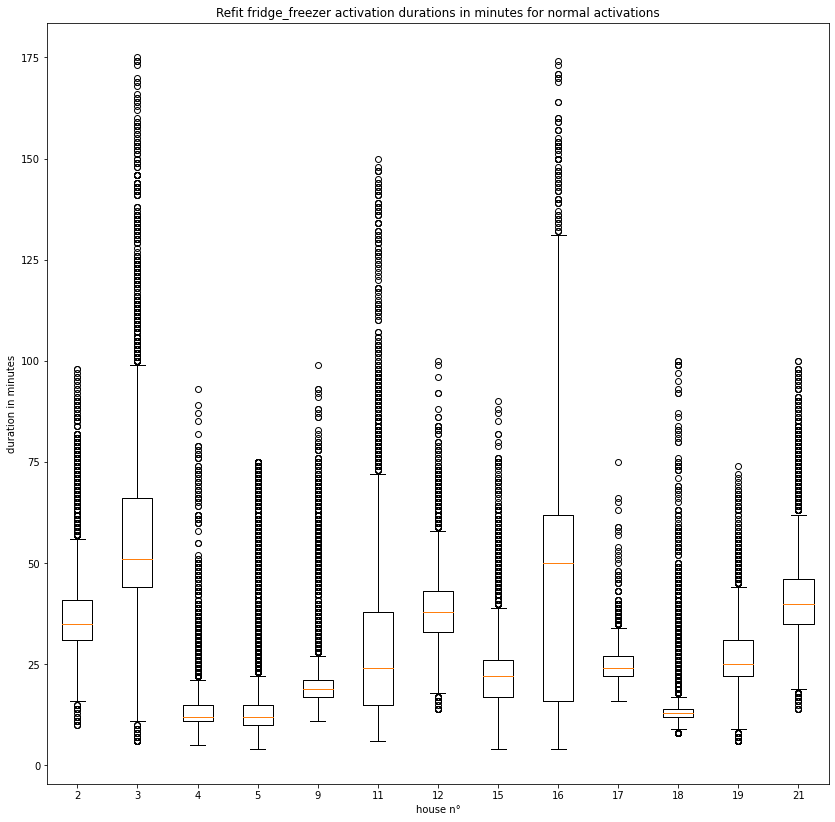

In [43]:
fig7, ax7 = plt.subplots(figsize=(14,14))
ax7.set_title('Refit fridge_freezer activation durations in minutes for normal activations')
ax7.boxplot(Refit_fridge_freezers_durations)
#ax7.set_ylim(0,70)
ax7.set_xticklabels(duration_anomolous_activations.keys())
plt.savefig('Refit_fridge_freezers_normal_activation.jpg',dpi=184)
plt.ylabel("duration in minutes")
plt.xlabel("house n°")
plt.show()

In [68]:
pool = mp.Pool(processes = 3)
result=pool.starmap(get_activation_type,((Refit_fridge_freezer_activations[i],duration_normal_activations[i],i) for i in duration_normal_activations.keys() ))

In [69]:
Refit_fridge_freezer_activation_type={}
for i in range(len(result)):
        Refit_fridge_freezer_activation_type[result[i][1]]=result[i][0]

In [70]:
for i in Refit_fridge_freezer_activation_type.keys():
    activations_to_csv(Refit_fridge_freezer_activations[i],Refit_fridge_freezer_activation_type[i],i)

In [23]:
len(duration_anomolous_activations[2])

1123

[6240, 3759, 13838, 23572, 13438, 3145, 4673, 8055, 4831, 8190, 18874, 5549, 5068]
[924, 1407, 726, 2620, 1734, 496, 431, 710, 732, 910, 1787, 4270, 746]


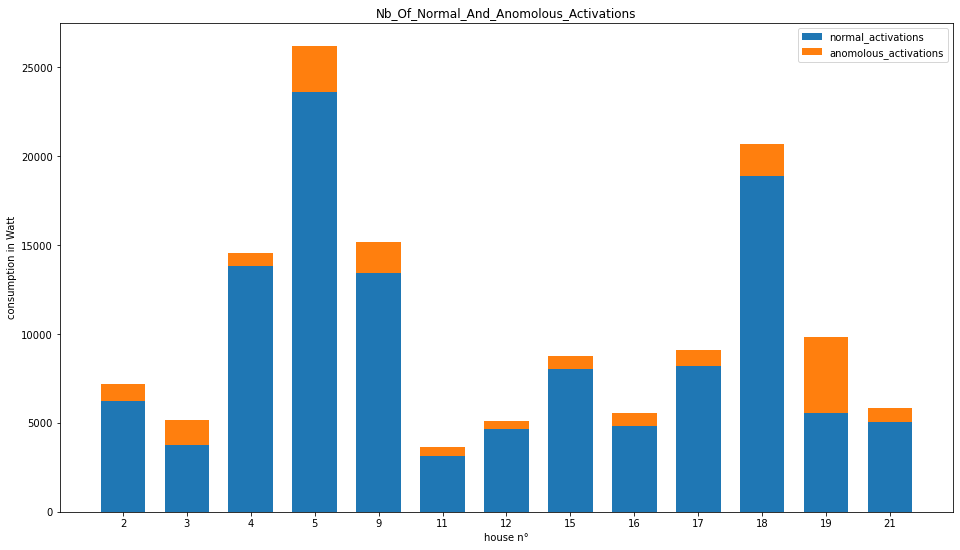

In [44]:
nb_normal_activations=[]
nb_anomolous_activations=[]
for i in duration_normal_activations.keys(): 
    nb_normal_activations.append(len(duration_normal_activations[i]))
    nb_anomolous_activations.append(len(duration_anomolous_activations[i]))
fig, ax = plt.subplots(figsize =(16, 9))
width =0.7
y_pos = np.arange(13)
ax.bar(np.arange(len(nb_normal_activations)), nb_normal_activations, width=width,label='normal_activations')
ax.bar(np.arange(len(nb_anomolous_activations)), nb_anomolous_activations,bottom=nb_normal_activations, width=width,label="anomolous_activations")
plt.xticks(y_pos, Refit_fridge_freezer_normal_activations.keys())
plt.title('Nb_Of_Normal_And_Anomolous_Activations')
plt.legend()
plt.ylabel("consumption in Watt")
plt.xlabel("house n°")

plt.savefig('Nb_Of_Normal_And_Anomolous_Activations_adding_duration_1.jpg',dpi=184)


#plt.show()
print(nb_normal_activations)
print(nb_anomolous_activations)

/home/mahdi/anaconda3/envs/tf-gpu/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:337: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


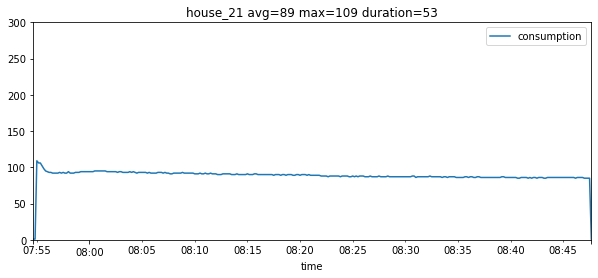

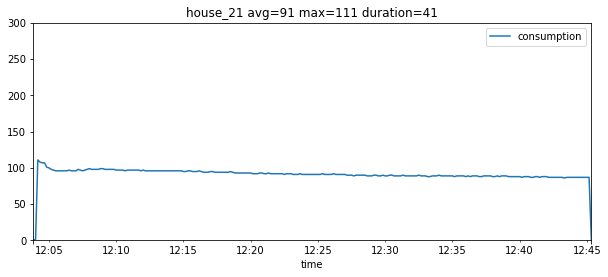

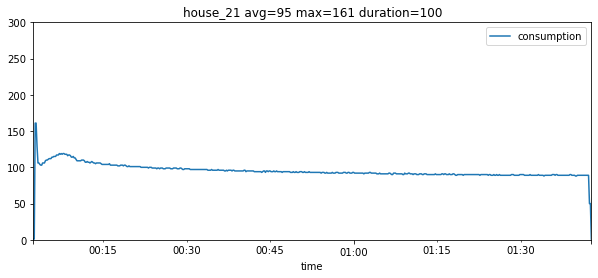

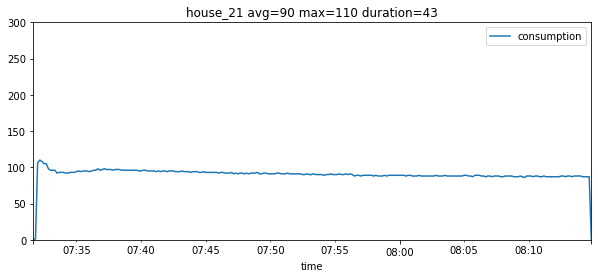

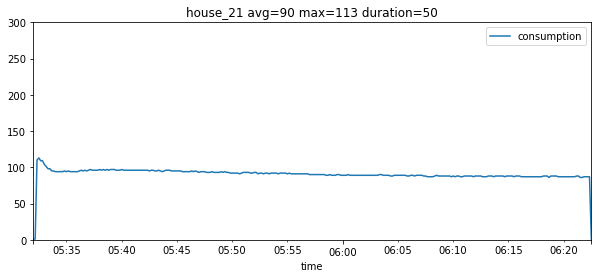

...

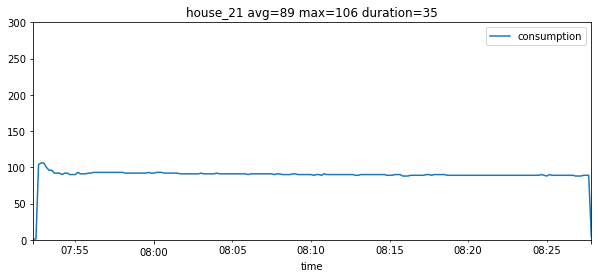

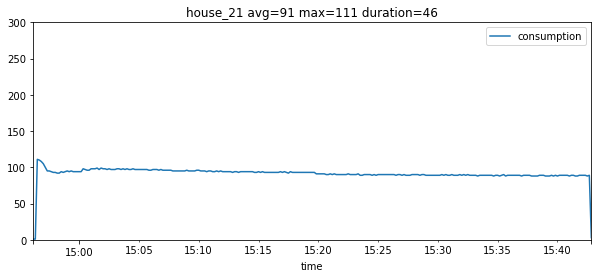

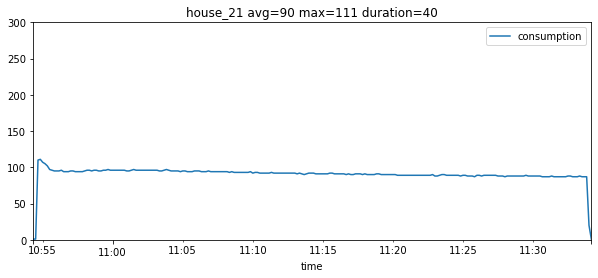

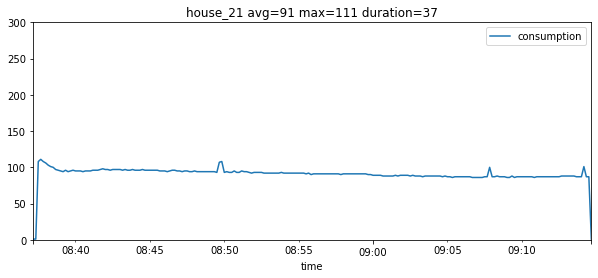

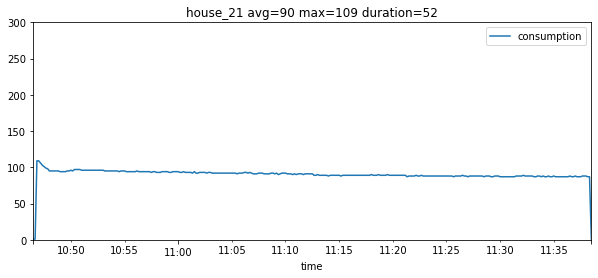

In [63]:
house=21
activations=random.sample(range(0, len(duration_normal_activations[house])),100)
df=Refit_fridge_freezers[house]
for activation in activations:
    beginning=duration_normal_activations[house][activation][0]
    end=duration_normal_activations[house][activation][1]
    avg=sum(df.consumption.iloc[beginning:end])/len(df.consumption.iloc[beginning:end])
    maximus=max(df.consumption.iloc[beginning:end])
    duration=int((end-beginning)/6)
    ax=df.iloc[beginning:end].plot(x="time",y=['consumption'], figsize=(10,4),title="house_"+str(house)+" avg="+str(round(avg))+" max="+str(maximus)+" duration="+str(duration))
    ax.set_ylim(0,300)

/home/mahdi/anaconda3/envs/tf-gpu/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:337: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


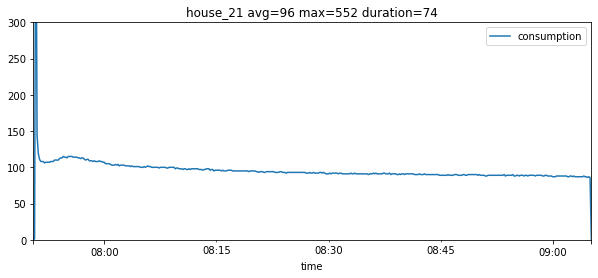

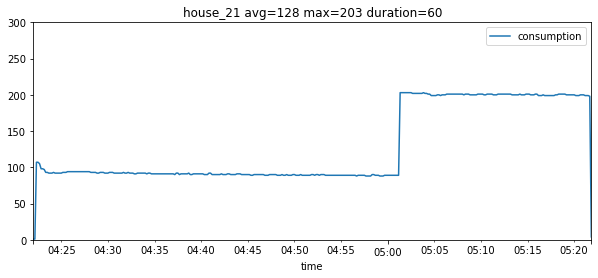

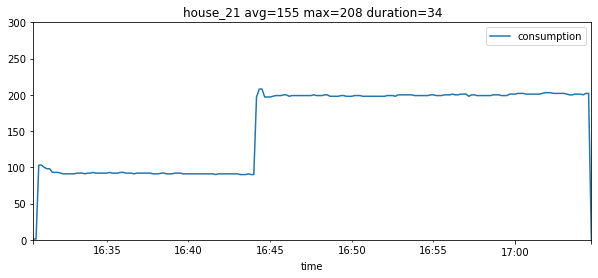

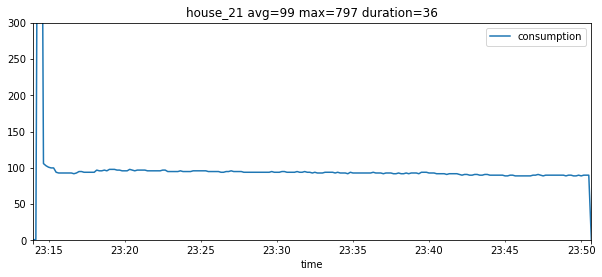

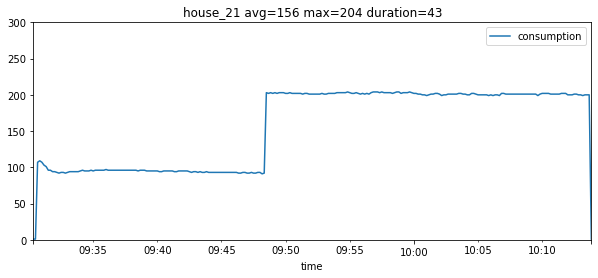

...

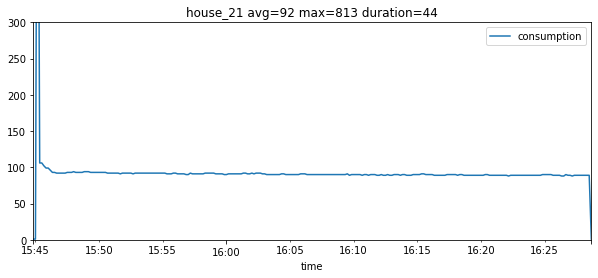

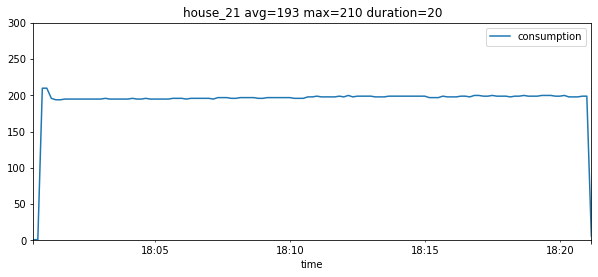

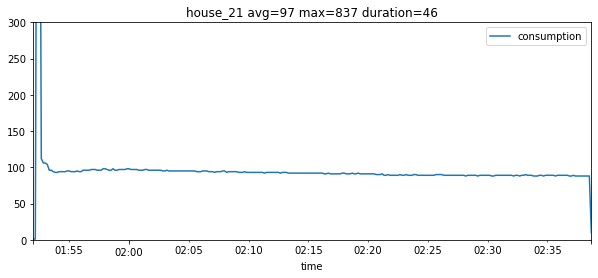

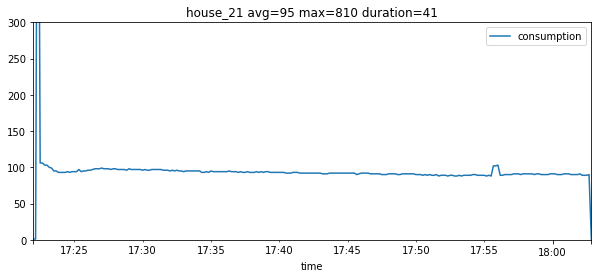

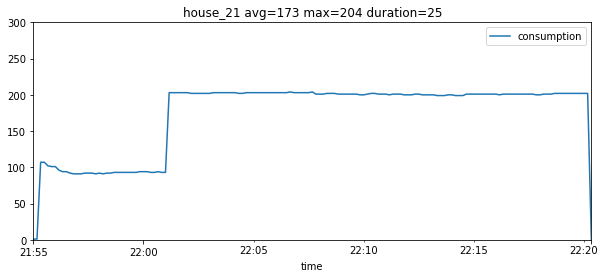

In [64]:
house=21
activations=random.sample(range(0, len(duration_anomolous_activations[house])),100)
df=Refit_fridge_freezers[house]
for activation in activations:
    beginning=duration_anomolous_activations[house][activation][0]
    end=duration_anomolous_activations[house][activation][1]
    avg=sum(df.consumption.iloc[beginning:end])/len(df.consumption.iloc[beginning:end])
    maximus=max(df.consumption.iloc[beginning:end])
    duration=int((end-beginning)/6)
    ax=df.iloc[beginning:end].plot(x="time",y=['consumption'], figsize=(10,4),title="house_"+str(house)+" avg="+str(round(avg))+" max="+str(maximus)+" duration="+str(duration))
    ax.set_ylim(0,300)